## Molecular Dynamics

Molecu;ar dynamics simulations help us understand how molecules interact with each other and self assemble into complex structures.

In MD silumation we approximate intermolecular forces/energy using mathematical functions. In this simultions, temperature is a driving force and it influences the assembly process becasue of the interplay between the intermolecular energy and thermal energy.

We will use newtons laws of motion to get the positions and force equilibrium. We will calculate the forces on the particles by describing the intermolecular potential energy. . To calculate the energy we will use the Lenord Johns potential which describes the attraction and repulsions of two atoms based on their distances

In thsi notebook we will learn the basic python implementation of Molecular dynamics.Here 

Source: https://nznano.blogspot.com/2017/11/molecular-dynamics-in-python.html


source: https://pythoninchemistry.org/sim_and_scat/molecular_dynamics/intro.html

https://www.uio.no/studier/emner/matnat/fys/FYS4460/v17/notes/md-2016-python.pdf

### Molecular Dynamics basics

1. Energy of the system as a function of positions of the atoms:  $E(r)$

2. Newton second law: $F = ma = m\ddot{x}$

3. Force equlilibrium: $F = -\frac{\mathrm{d} E(r)}{\mathrm{d} x}$

4. Lennard-Johnes potential energy: $E_{ij}(r) = 4\epsilon[{(\frac{\sigma}{r}})^{12} - {(\frac{\sigma}{r}})^{6}]$

    - $E(r)$: energy of the system as a function of positions of all atoms
    - $F$: Forces on particles
    - $\sigma$: Vandervals radius,radius where the potential energy is zero; defiens the range of interactions btw two particles.



## Lenorad Johns potential 

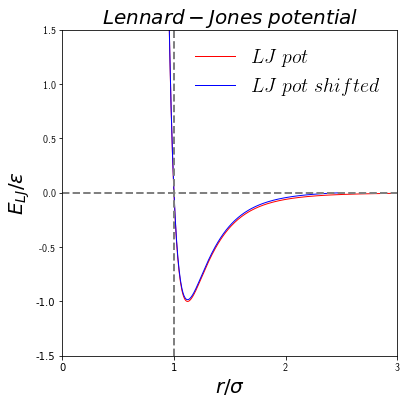

In [1]:
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

r = np.linspace(0.01,3.0,num=500) # Make a radius vector
epsilon = 1 # Energy minimum
sigma = 1 # Distance to zero crossing point
E_LJ = 4*epsilon*((sigma/r)**12-(sigma/r)**6) # Lennard-Jones potential

plt.figure(figsize=[6,6])
plt.plot(r,E_LJ,'r-',linewidth=1,label=r" $LJ\; pot$") # Red line is unshifted LJ

# The cutoff and shifting value
Rcutoff = 2.5
phicutoff = 4.0/(Rcutoff**12)-4.0/(Rcutoff**6) # Shifts the potential so at the cutoff the potential goes to zero

E_LJ_shift = E_LJ - phicutoff # Subtract the value of the potential at r=2.5

plt.plot(r[:415],E_LJ_shift[:415],'b-',linewidth=1,label=r"$LJ\; pot\; shifted$") # Blue line is shifted

#Plot formatting
plt.rc('text', usetex=True)
plt.rc('xtick', labelsize=20) 
plt.rc('ytick', labelsize=20) 
plt.title(r"$Lennard-Jones\; potential$",fontsize=20)
plt.xlim([0.0,3.0])
plt.ylim([-1.5,1.5])
plt.ylabel(r"$E_{LJ}/\epsilon$",fontsize=20)
plt.xlabel(r"$r/\sigma$",fontsize=20)
plt.legend(frameon=False,fontsize=20)
plt.axhline(0, color='grey',linestyle='--',linewidth=2)
plt.axvline(1, color='grey',linestyle='--',linewidth=2)

## Steps

The molecular dynamics program contains the instructions for the computer to use to move atoms through time. 

1. INitialize the positions of the particals


2. Calcuate the pairwise forces on the particals by calculating the gradient of the potential enegery 


3. Compute new positions by integrating th eequation of motion: Veclocity verlet integration


4. Apply thermosat to maintail the temperature at the set value; use velocity scalling for temperature control


5. Go back to step 2, recompute the forces and continue untill the maximum number of steps 


In [2]:
import plotly.express as px
import pandas as pd
from plotly.subplots import make_subplots

# Import the necessaries libraries
import plotly.offline as pyo
import plotly.graph_objs as go
# Set notebook mode to work in offline
pyo.init_notebook_mode()

%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [111]:
def Compute_Forces(pos,acc,ene_pot,epsilon,BoxSize,DIM,N):
    # Compute forces on positions using the Lennard-Jones potential
    # Uses double nested loop which is slow O(N^2) time unsuitable for large systems
    Sij = np.zeros(DIM) # Box scaled units
    Rij = np.zeros(DIM) # Real space units
    
    #Set all variables to zero
    ene_pot = ene_pot*0.0
    acc = acc*0.0
    virial=0.0
    
    # Loop over all pairs of particles
    for i in range(N-1):
        for j in range(i+1,N): #i+1 to N ensures we do not double count
            Sij = pos[i,:]-pos[j,:] # Distance in box scaled units
            for l in range(DIM): # Periodic interactions
                if (np.abs(Sij[l])>0.5):
                    Sij[l] = Sij[l] - np.copysign(1.0,Sij[l]) # If distance is greater than 0.5  (scaled units) then subtract 0.5 to find periodic interaction distance.
            
            Rij = BoxSize*Sij # Scale the box to the real units in this case reduced LJ units
            Rsqij = np.dot(Rij,Rij) # Calculate the square of the distance
            
            if(Rsqij < Rcutoff**2):
                # Calculate LJ potential inside cutoff
                # We calculate parts of the LJ potential at a time to improve the efficieny of the computation (most important for compiled code)
                rm2 = 1.0/Rsqij # 1/r^2
                rm6 = rm2**3.0 # 1/r^6
                rm12 = rm6**2.0 # 1/r^12
                phi = epsilon*(4.0*(rm12-rm6)-phicutoff) # 4[1/r^12 - 1/r^6] - phi(Rc) - we are using the shifted LJ potential
                
                
                rm4 = rm2**2 # 1/r^4
                phi = epsilon*(4.0*(rm2+rm4)) # 4[1/r^12 - 1/r^6] - phi(Rc) - we are using the shifted LJ potential
                
                # The following is dphi = -(1/r)(dV/dr)
                dphi = epsilon*24.0*rm2*(2.0*rm12-rm6) # 24[2/r^14 - 1/r^8]
                ene_pot[i] = ene_pot[i]+0.5*phi # Accumulate energy
                ene_pot[j] = ene_pot[j]+0.5*phi # Accumulate energy
                virial = virial + dphi*np.sqrt(Rsqij) # Virial is needed to calculate the pressure
                acc[i,:] = acc[i,:]+dphi*Sij # Accumulate forces
                acc[j,:] = acc[j,:]-dphi*Sij # (Fji=-Fij)
    return acc, np.sum(ene_pot)/N, -virial/DIM # return the acceleration vector, potential energy and virial coefficient
            

In [112]:
def Calculate_Temperature(vel,BoxSize,DIM,N):
    
    ene_kin = 0.0
    
    for i in range(N):
        real_vel = BoxSize*vel[i,:]
        ene_kin = ene_kin + 0.5*np.dot(real_vel,real_vel)
    
    ene_kin_aver = 1.0*ene_kin/N
    temperature = 2.0*ene_kin_aver/DIM
    
    return ene_kin_aver,temperature


## 1. Initialize the particles

In [113]:
DIM       = 2     # Dimensions
N         = 32    # number of particles
BoxSize   = 10.0  #6.35 

volume    = BoxSize**DIM
density   = N / volume

pos = np.random.randint(low=-4,high=4,size=(32,2))             # positions of the atoms

pos = pos[:,:DIM]/BoxSize
MassCentre = np.sum(pos,axis=0)/N     # center of mass

for i in range(DIM):
    pos[:,i] = pos[:,i]-MassCentre[i]
    
print("volume = ", volume, " density = ", density)

volume =  100.0  density =  0.32


# 2. Integrating Equation of motion with Velocity Verlot

for integrating the newtons equations of motion in 1D we will use vellocity verolet integrator 

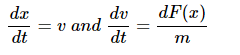

The velocity verlet algorithem splits the velocity update into two steps nitially doing a half step then modifying yhe acceleration and then doing the second velocity update. 

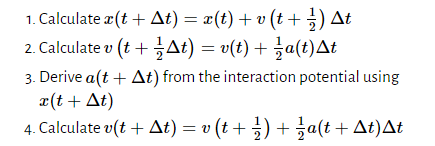


Between steps 1 and 2 we will rescale the velocities to maintain the temperature at the requested value

In [114]:
from tqdm import tqdm
%pylab inline
import matplotlib.pyplot as plt
from IPython import display

Populating the interactive namespace from numpy and matplotlib


/usr/local/lib/python3.6/dist-packages/IPython/core/magics/pylab.py:160: UserWarning:

pylab import has clobbered these variables: ['display']
`%matplotlib` prevents importing * from pylab and numpy



In [115]:
# Main MD loop
def main(pos,NSteps,deltat,TRequested,DumpFreq,epsilon,BoxSize,DIM):
    
    # Vectors to store parameter values at each step
    N = np.size(pos[:,1])
    ene_kin_aver = np.ones(NSteps)
    ene_pot_aver = np.ones(NSteps)
    temperature = np.ones(NSteps)
    virial = np.ones(NSteps)
    pressure = np.ones(NSteps)
    ene_pot = np.ones(N)

    vel = (np.random.randn(N,DIM)-0.5)
    acc = (np.random.randn(N,DIM)-0.5)

    # Open file which we will save the outputs to
    f = open('traj.xyz', 'w')
    
    for k in tqdm(range(NSteps)):
        
        # Refold positions according to periodic boundary conditions
        for i in range(DIM):
            period = np.where(pos[:,i] > 0.5)
            pos[period,i]=pos[period,i]-1.0
            period = np.where(pos[:,i] < -0.5)
            pos[period,i]=pos[period,i]+1.0

        # r(t+dt) modify positions according to velocity and acceleration
        pos = pos + deltat*vel + 0.5*(deltat**2.0)*acc # Step 1

        # Calculate temperature
        ene_kin_aver[k],temperature[k] = Calculate_Temperature(vel,BoxSize,DIM,N)

        # Rescale velocities and take half step
        chi = np.sqrt(TRequested/temperature[k])
        vel = chi*vel + 0.5*deltat*acc # v(t+dt/2) Step 2

        # Compute forces a(t+dt),ene_pot,virial
        acc, ene_pot_aver[k], virial[k] = Compute_Forces(pos,acc,ene_pot,epsilon,BoxSize,DIM,N) # Step 3

        # Complete the velocity step 
        vel = vel + 0.5*deltat*acc # v(t+dt/2) Step 4

        # Calculate temperature
        ene_kin_aver[k],temperature[k] = Calculate_Temperature(vel,BoxSize,DIM,N)

        # Calculate pressure
        pressure[k]= density*temperature[k] + virial[k]/volume
        
              
        
        # Print output to file every DumpFreq number of steps
        if(k%DumpFreq==0): # The % symbol is the modulus so if the Step is a whole multiple of DumpFreq then print the values

            f.write("%s\n" %(N)) # Write the number of particles to file
            # Write all of the quantities at this step to the file
            f.write("Energy %s, Temperature %.5f\n" %(ene_kin_aver[k]+ene_pot_aver[k],temperature[k]))
            for n in range(N): # Write the positions to file
                f.write("X"+" ")
                for l in range(DIM):
                    f.write(str(pos[n][l]*BoxSize)+" ")
                f.write("\n")
            
            if(DIM==2):
                #import matplotlib.pyplot as plt
                #from IPython import display
                plt.figure(figsize=(10,10))
                plt.cla()
                plt.xlim(-0.5*BoxSize,0.5*BoxSize)
                plt.ylim(-0.5*BoxSize,0.5*BoxSize)
                for i in range(N):
                    plt.plot(pos[i,0]*BoxSize,pos[i,1]*BoxSize,'o',markersize=20,)
                display.clear_output(wait=True)
                display.display(plt.gcf())
                
                
        #print(ene_kin_aver[k], ene_pot_aver[k], temperature[k], pressure[k]) 

    f.close() # Close the file


    return ene_kin_aver, ene_pot_aver, temperature, pressure, pos

In [116]:
DIM       = 2     # Dimensions
N         = 32    # number of particles
BoxSize   = 10.0  #6.35 

volume    = BoxSize**DIM
density   = N / volume

pos = np.random.randint(low=-4,high=4,size=(32,2))             # positions of the atoms

pos = pos[:,:DIM]/BoxSize
MassCentre = np.sum(pos,axis=0)/N     # center of mass

for i in range(DIM):
    pos[:,i] = pos[:,i]-MassCentre[i]
    
print("volume = ", volume, " density = ", density)

volume =  100.0  density =  0.32


In [137]:
# Setting up the simulation
NSteps     =10000    # Number of steps
deltat     = 0.0032 # Time step in reduced time units
TRequested = 100.0  # Reduced temperature
DumpFreq   = 100    # Save the position to file every DumpFreq steps
epsilon    = 100.0    # LJ parameter for the energy between particles

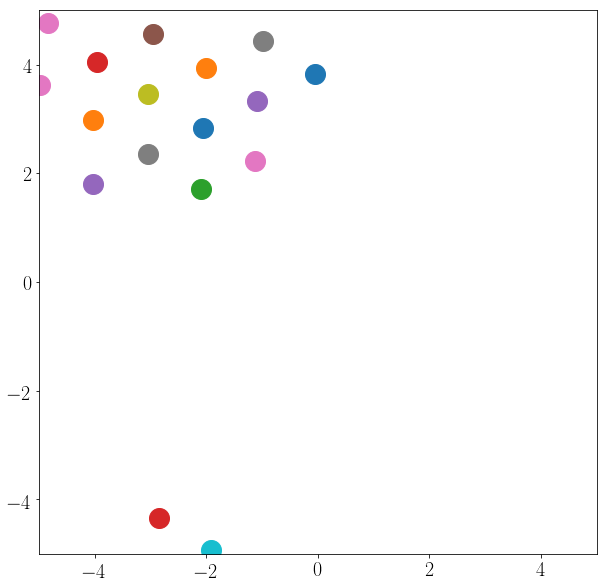

100%|██████████| 10000/10000 [01:02<00:00, 160.53it/s]


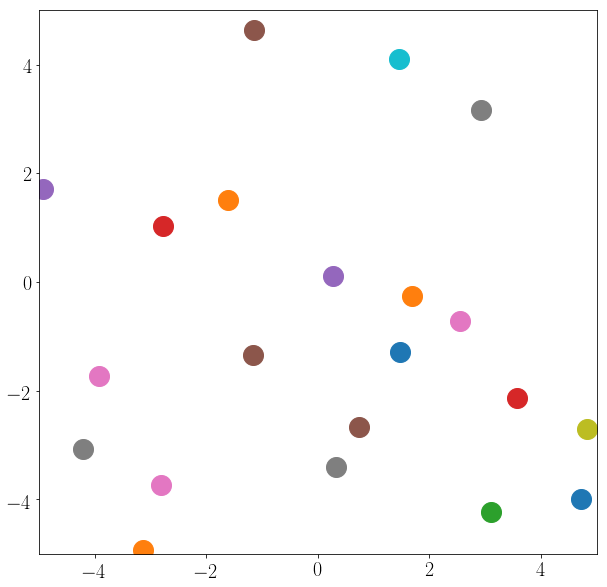

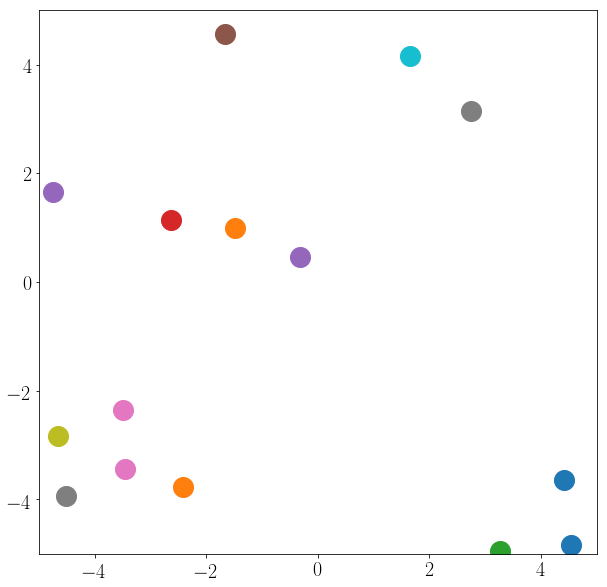

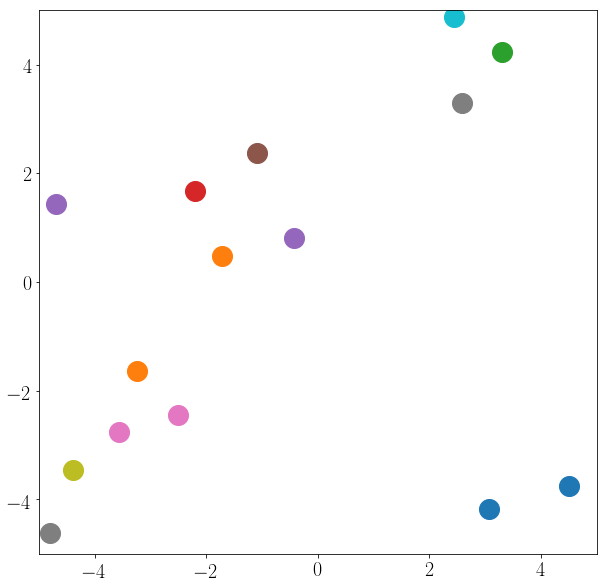

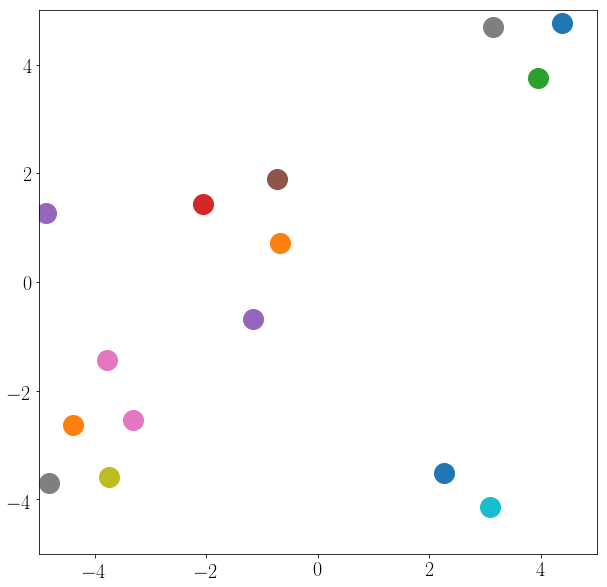

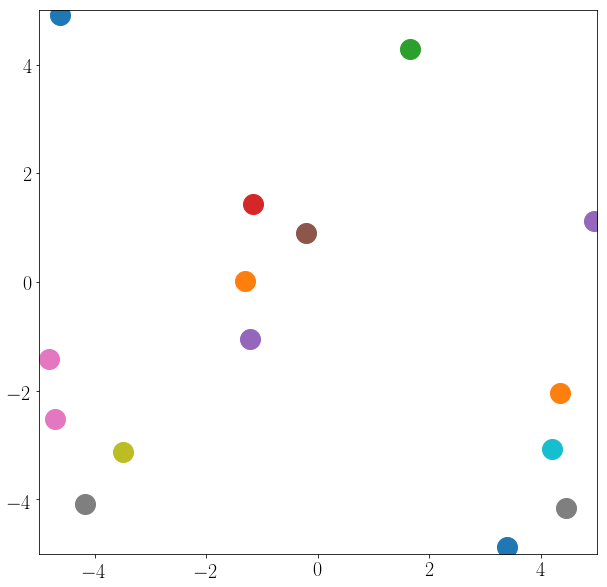

...

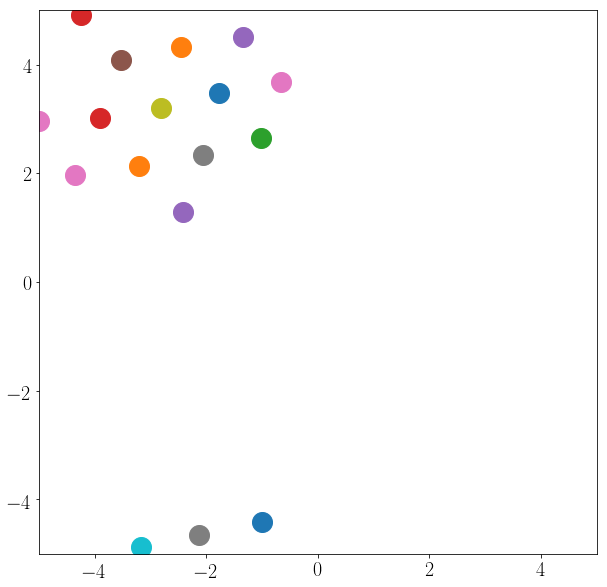

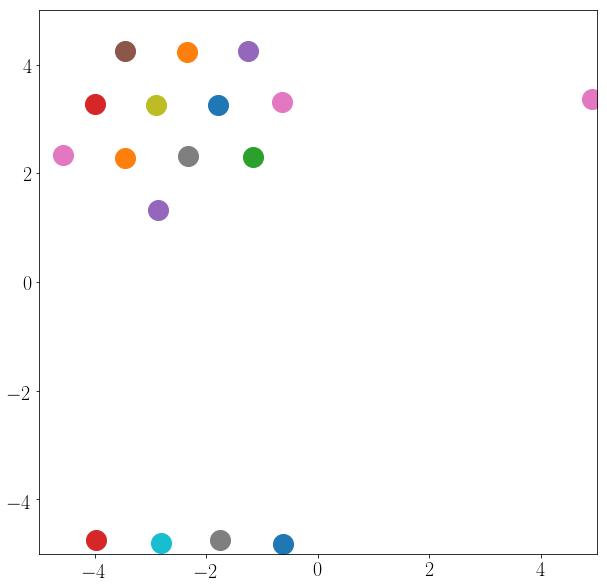

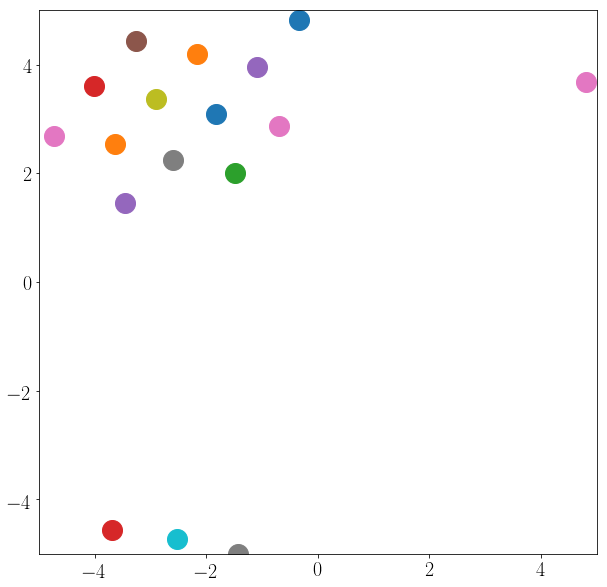

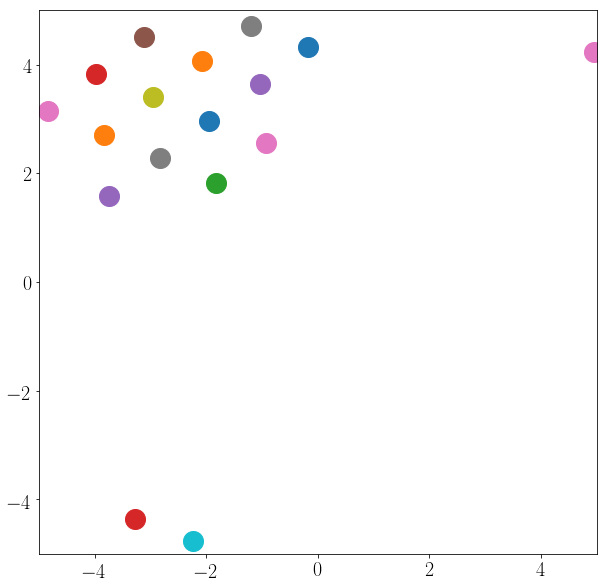

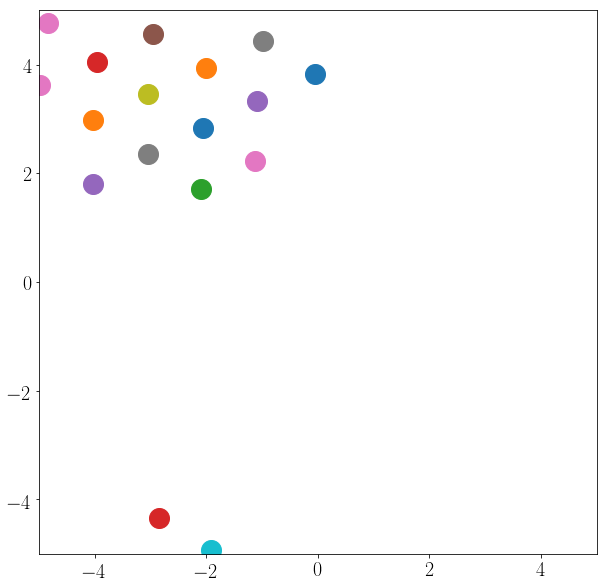

In [138]:
ene_kin_aver, ene_pot_aver, temperature, pressure, pos = main(pos,NSteps,deltat,TRequested,DumpFreq,epsilon,BoxSize,DIM)

In [139]:
temperature = np.clip(temperature,-100.0,100.0)
pressure = np.clip(pressure,-100.0,100.0)
ene_kin_aver = np.clip(ene_kin_aver,-100.0,100.0)
ene_pot_aver = np.clip(ene_pot_aver,-100.0,100.0)

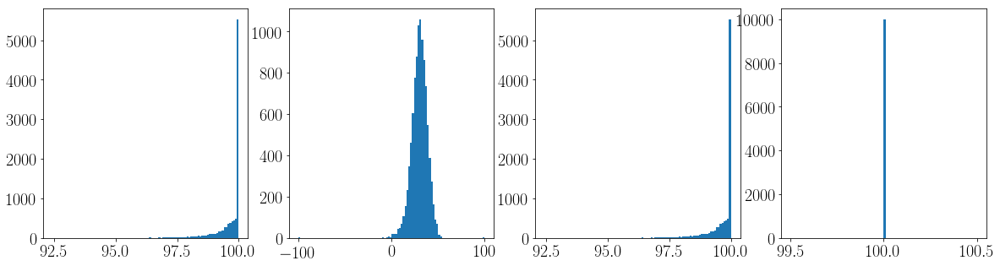

In [141]:
plt.figure(figsize=(20,5))
plt.subplot(1,4,1)
plt.hist(temperature,100)
plt.subplot(1,4,2)
plt.hist(pressure,100)
plt.subplot(1,4,3)
plt.hist(ene_kin_aver,100)
plt.subplot(1,4,4)
plt.hist(ene_pot_aver,100)
plt.show()

In [142]:
fig = go.Figure(go.Scattergl(
            x = temperature,
            y = pressure,
            mode='markers',
            marker=dict(size=3,
                        color=np.linspace(0,1,temperature.shape[0]))
            ))
fig.show()

In [144]:
fig = go.Figure(go.Scattergl(
            x = ene_pot_aver,
            y = ene_kin_aver,
            mode='markers',
            marker=dict(size=3,
                        color=np.linspace(0,1,temperature.shape[0]))
            ))
fig.show()

In [145]:
fig = go.Figure(go.Scatter3d(
            x = temperature,
            y = pressure,
            z = ene_pot_aver,
            mode='markers',
            marker=dict(size=3,
                        color=np.linspace(0,1,temperature.shape[0]))
            ))
fig.show()

In [ ]:
# Plot all of the quantities
def plot():
    plt.figure(figsize=[7,12])
    
    plt.subplot(4, 1, 1)
    plt.plot(ene_kin_aver,'k-')
    plt.subplot(4, 1, 2)
    plt.plot(ene_pot_aver,'k-')
    plt.subplot(4, 1, 3)
    plt.plot(temperature,'k-')
    plt.subplot(4, 1, 4)
    plt.plot(pressure,'k-')
    
    plt.show()

plot()

In [ ]:
print("Temperature = ", np.average(temperature), "+-", 2*np.std(temperature))

In [ ]:
print("Pressure = ", np.average(pressure), "+-", 2*np.std(pressure))

In [ ]:
def plot_scatter(data):
    
    fig = make_subplots(rows=1, cols=2,subplot_titles=["time series","X[1::20] vs X[5::20]"])


    fig.add_trace(go.Scattergl(
                                x = np.linspace(0,1,data.shape[0]),
                                y = data,
                                mode='markers',
                                marker=dict(size=3)
                                ), 1,1)


    fig.add_trace(go.Scattergl(
                                x = data[0::2],
                                y = data[1::2],
                                mode='markers',
                                marker=dict(size=3)
                                ), 1,2)



    fig.show()

In [ ]:
plot_scatter(temperature)

In [ ]:
plot_scatter(pressure)

In [ ]:
plot_scatter(ene_kin_aver)

In [ ]:
plot_scatter(ene_pot_aver)

In [ ]:
fig = go.Figure(go.Scattergl(
            x = temperature,
            y = pressure,
            mode='markers',
            marker=dict(size=3,
                        color=np.linspace(0,1,temperature.shape[0]))
            ))
fig.show()

In [128]:
fig = go.Figure(go.Scattergl(
            x = ene_pot_aver,
            y = ene_kin_aver,
            mode='markers',
            marker=dict(size=3,
                        color=np.linspace(0,1,temperature.shape[0]))
            ))
fig.show()

In [136]:
fig = go.Figure(go.Scattergl(
            x = temperature,
            y = ene_pot_aver,
            mode='markers',
            marker=dict(size=3,
                        color=np.linspace(0,1,temperature.shape[0]))
            ))
fig.show()

In [126]:
fig = go.Figure(go.Scatter3d(
            x = temperature,
            y = ene_pot_aver,
            z = ene_pot_aver,
            mode='markers',
            marker=dict(size=3,
                        color=np.linspace(0,1,temperature.shape[0]))
            ))
fig.show()

In [127]:
fig = go.Figure(go.Scatter3d(
            x = temperature,
            y = pressure,
            z = np.linspace(0,1,temperature.shape[0]),
            mode='markers',
            marker=dict(size=3,
                        color=np.linspace(0,1,temperature.shape[0]))
            ))
fig.show()

In [ ]:
fig = go.Figure(go.Scatter3d(
            x = temperature,
            y = pressure,
            z = ene_pot_aver,
            mode='markers',
            marker=dict(size=3,
                        color=np.linspace(0,1,temperature.shape[0]))
            ))
fig.show()